# Object Detection API Demo via Tensorflow2 object detection api

In [2]:
import tensorflow as tf
print("GPU Available: ", tf.test.is_gpu_available())

print("Tensorflow Version: ", tf.__version__)
print("Keras Version: ", tf.keras.__version__)

#check GPU
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print(physical_devices)

GPU Available:  True
Tensorflow Version:  2.3.0
Keras Version:  2.4.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [3]:
!nvidia-smi

Tue Sep 15 19:02:44 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.66       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P0    37W / 300W |    433MiB / 16130MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

# Object Detection API Installation

Ref: https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2.md

In [4]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2166, done.
remote: Counting objects: 100% (2166/2166), done.
remote: Compressing objects: 100% (1871/1871), done.
remote: Total 2166 (delta 518), reused 938 (delta 270), pack-reused 0
Receiving objects: 100% (2166/2166), 30.38 MiB | 13.64 MiB/s, done.
Resolving deltas: 100% (518/518), done.


In [ ]:
!protoc --version

libprotoc 3.0.0


In [ ]:
!pip list

Package                       Version            
----------------------------- -------------------
absl-py                       0.10.0             
alabaster                     0.7.12             
albumentations                0.1.12             
altair                        4.1.0              
argon2-cffi                   20.1.0             
asgiref                       3.2.10             
astor                         0.8.1              
astropy                       4.0.1.post1        
astunparse                    1.6.3              
async-generator               1.10               
atari-py                      0.2.6              
atomicwrites                  1.4.0              
attrs                         20.2.0             
audioread                     2.1.8              
autograd                      1.3                
Babel                         2.8.0              
backcall                      0.2.0              
beautifulsoup4                4.6.3              


In [5]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/models/research
  Created wheel for object-detection: filename=object_detection-0.1-cp36-none-any.whl size=1577686 sha256=099811e6b052903e3cd333781a0ce2c39e8a096696a7c4162c5829bf6e4e5e67
  Stored in directory: /tmp/pip-ephem-wheel-cache-tpvavn4_/wheels/94/49/4b/39b051683087a22ef7e80ec52152a27249d1a644ccf4e442ea
  Created wheel for avro-python3: filename=avro_python3-1.10.0-cp36-none-any.whl size=43735 sha256=c8d3f3f23bc28a547c7e17d6dd6b9e257ab54c65c0c2e7aaf7a6ad1f98dcc18f
  Stored in directory: /root/.cache/pip/wheels/3f/15/cd/fe4ec8b88c130393464703ee8111e2cddebdc40e1b59ea85e9
  Created wheel for oauth2client: filename=oauth2client-3.0.0-cp36-none-any.whl size=106382 sha256=e5c8752a3eb0f3322d0f7726ad4387f381fd896a579af85a77b0016bc301d7e8
  Stored in directory: /root/.cache/pip/wheels/48/f7/87/b932f09c6335dbcf45d916937105a372ab14f353a9ca431d7d
  Created wheel for dill: filename=dill-0.3.1.1-cp36-none-any.whl size=78532 sha256=9eddfd0ef8c013d536355f137c89c7992c96acb86

ERROR: pydrive 1.3.1 has requirement oauth2client>=4.0.0, but you'll have oauth2client 3.0.0 which is incompatible.
ERROR: multiprocess 0.70.10 has requirement dill>=0.3.2, but you'll have dill 0.3.1.1 which is incompatible.
ERROR: apache-beam 2.23.0 has requirement avro-python3!=1.9.2,<1.10.0,>=1.8.1; python_version >= "3.0", but you'll have avro-python3 1.10.0 which is incompatible.


In [6]:
!python ./models/research/object_detection/builders/model_builder_tf2_test.py

2020-09-15 19:04:15.022080: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Running tests under Python 3.6.9: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_model
2020-09-15 19:04:17.253551: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-15 19:04:17.258940: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-15 19:04:17.259532: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.75GiB deviceMemoryBandwidth: 836.37GiB/s
2020-09-15 19:04:17.259582: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Su

In [7]:
import matplotlib
import matplotlib.pyplot as plt

import io
import scipy.misc
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf

from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.builders import model_builder

%matplotlib inline

# Inference
ref: https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/inference_tf2_colab.ipynb

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: the file path to the image

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

def get_keypoint_tuples(eval_config):
  """Return a tuple list of keypoint edges from the eval config.
  
  Args:
    eval_config: an eval config containing the keypoint edges
  
  Returns:
    a list of edge tuples, each in the format (start, end)
  """
  tuple_list = []
  kp_list = eval_config.keypoint_edge
  for edge in kp_list:
    tuple_list.append((edge.start, edge.end))
  return tuple_list

In [ ]:
# @title Choose the model to use, then evaluate the cell.
MODELS = {'centernet_with_keypoints': 'centernet_hg104_512x512_kpts_coco17_tpu-32', 'centernet_without_keypoints': 'centernet_hg104_512x512_coco17_tpu-8'}

model_display_name = 'centernet_without_keypoints' # @param ['centernet_with_keypoints', 'centernet_without_keypoints']
model_name = MODELS[model_display_name]

In [ ]:
# Download the checkpoint and put it into models/research/object_detection/test_data/

if model_display_name == 'centernet_with_keypoints':
  !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_hg104_512x512_kpts_coco17_tpu-32.tar.gz
  !tar -xf centernet_hg104_512x512_kpts_coco17_tpu-32.tar.gz
  !mv centernet_hg104_512x512_kpts_coco17_tpu-32/checkpoint models/research/object_detection/test_data/
else:
  !wget http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_hg104_512x512_coco17_tpu-8.tar.gz
  !tar -xf centernet_hg104_512x512_coco17_tpu-8.tar.gz
  !mv centernet_hg104_512x512_coco17_tpu-8/checkpoint models/research/object_detection/test_data/

--2020-09-12 05:29:14--  http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_hg104_512x512_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.126.128, 2a00:1450:4013:c01::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.126.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1426100886 (1.3G) [application/x-tar]
Saving to: ‘centernet_hg104_512x512_coco17_tpu-8.tar.gz’

centernet_hg104_512 100%[===================>]   1.33G   122MB/s    in 12s     

2020-09-12 05:29:27 (109 MB/s) - ‘centernet_hg104_512x512_coco17_tpu-8.tar.gz’ saved [1426100886/1426100886]



In [ ]:
model_name

'centernet_hg104_512x512_coco17_tpu-8'

In [ ]:
!ls models/research/object_detection/test_data/

checkpoint			 snapshot_serengeti_sequence_examples.record
context_rcnn_camera_trap.config  ssd_mobilenet_v1_fpp.config
pets_examples.record


In [ ]:
!pwd

/content


In [ ]:
!ls

centernet_hg104_512x512_coco17_tpu-8	     models
centernet_hg104_512x512_coco17_tpu-8.tar.gz  sample_data


In [ ]:
# pipeline_config = os.path.join('models/research/object_detection/configs/tf2/',
#                                 'center_net_hourglass104_512x512_coco17_tpu-8' + '.config')
pipeline_config = os.path.join('./centernet_hg104_512x512_coco17_tpu-8/' + 'pipeline.config')
model_dir = 'models/research/object_detection/test_data/checkpoint/'

# Load pipeline config and build a detection model
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(model_dir, 'ckpt-0')).expect_partial()

def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

In [ ]:
pipeline_config

'./centernet_hg104_512x512_coco17_tpu-8/pipeline.config'

In [ ]:
!cp models/research/object_detection/configs/tf2/center_net_hourglass104_512x512_coco17_tpu-8.config .

In [ ]:
label_map_path = configs['eval_input_config'].label_map_path
label_map_path

'PATH_TO_BE_CONFIGURED/label_map.txt'

In [ ]:
label_map_path='/content/models/research/object_detection/data/mscoco_label_map.pbtxt'

In [ ]:
label_map = label_map_util.load_labelmap(label_map_path)
label_map

item {
  name: "/m/01g317"
  id: 1
  display_name: "person"
}
item {
  name: "/m/0199g"
  id: 2
  display_name: "bicycle"
}
item {
  name: "/m/0k4j"
  id: 3
  display_name: "car"
}
item {
  name: "/m/04_sv"
  id: 4
  display_name: "motorcycle"
}
item {
  name: "/m/05czz6l"
  id: 5
  display_name: "airplane"
}
item {
  name: "/m/01bjv"
  id: 6
  display_name: "bus"
}
item {
  name: "/m/07jdr"
  id: 7
  display_name: "train"
}
item {
  name: "/m/07r04"
  id: 8
  display_name: "truck"
}
item {
  name: "/m/019jd"
  id: 9
  display_name: "boat"
}
item {
  name: "/m/015qff"
  id: 10
  display_name: "traffic light"
}
item {
  name: "/m/01pns0"
  id: 11
  display_name: "fire hydrant"
}
item {
  name: "/m/02pv19"
  id: 13
  display_name: "stop sign"
}
item {
  name: "/m/015qbp"
  id: 14
  display_name: "parking meter"
}
item {
  name: "/m/0cvnqh"
  id: 15
  display_name: "bench"
}
item {
  name: "/m/015p6"
  id: 16
  display_name: "bird"
}
item {
  name: "/m/01yrx"
  id: 17
  display_name: "cat

In [ ]:
#label_map_path = configs['eval_input_config'].label_map_path
#label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

In [ ]:
label_map_dict

{'airplane': 5,
 'apple': 53,
 'backpack': 27,
 'banana': 52,
 'baseball bat': 39,
 'baseball glove': 40,
 'bear': 23,
 'bed': 65,
 'bench': 15,
 'bicycle': 2,
 'bird': 16,
 'boat': 9,
 'book': 84,
 'bottle': 44,
 'bowl': 51,
 'broccoli': 56,
 'bus': 6,
 'cake': 61,
 'car': 3,
 'carrot': 57,
 'cat': 17,
 'cell phone': 77,
 'chair': 62,
 'clock': 85,
 'couch': 63,
 'cow': 21,
 'cup': 47,
 'dining table': 67,
 'dog': 18,
 'donut': 60,
 'elephant': 22,
 'fire hydrant': 11,
 'fork': 48,
 'frisbee': 34,
 'giraffe': 25,
 'hair drier': 89,
 'handbag': 31,
 'horse': 19,
 'hot dog': 58,
 'keyboard': 76,
 'kite': 38,
 'knife': 49,
 'laptop': 73,
 'microwave': 78,
 'motorcycle': 4,
 'mouse': 74,
 'orange': 55,
 'oven': 79,
 'parking meter': 14,
 'person': 1,
 'pizza': 59,
 'potted plant': 64,
 'refrigerator': 82,
 'remote': 75,
 'sandwich': 54,
 'scissors': 87,
 'sheep': 20,
 'sink': 81,
 'skateboard': 41,
 'skis': 35,
 'snowboard': 36,
 'spoon': 50,
 'sports ball': 37,
 'stop sign': 13,
 'suitca

Instructions for updating:
Use `tf.cast` instead.


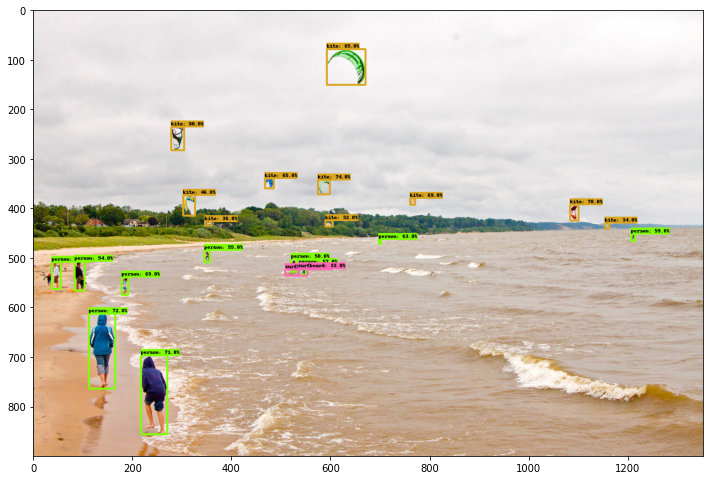

In [ ]:
image_dir = 'models/research/object_detection/test_images/'
image_path = os.path.join(image_dir, 'image2.jpg')
image_np = load_image_into_numpy_array(image_path)

# Things to try:
# Flip horizontally
# image_np = np.fliplr(image_np).copy()

# Convert image to grayscale
# image_np = np.tile(
#     np.mean(image_np, 2, keepdims=True), (1, 1, 3)).astype(np.uint8)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

# Use keypoints if available in detections
keypoints, keypoint_scores = None, None
if 'detection_keypoints' in detections:
  keypoints = detections['detection_keypoints'][0].numpy()
  keypoint_scores = detections['detection_keypoint_scores'][0].numpy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False,
      keypoints=keypoints,
      keypoint_scores=keypoint_scores,
      keypoint_edges=get_keypoint_tuples(configs['eval_config']))

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

In [ ]:
detections['detection_boxes'][0] #get the first batch, only one batch

<tf.Tensor: shape=(100, 4), dtype=float32, numpy=
array([[0.26331702, 0.20630795, 0.3134004 , 0.2257505 ],
       [0.43730366, 0.80151385, 0.4719698 , 0.8148971 ],
       [0.38156968, 0.42489603, 0.41272268, 0.44364318],
       [0.681903  , 0.08294669, 0.84796304, 0.12350222],
       [0.77523005, 0.16085468, 0.95053935, 0.2007731 ],
       [0.5992846 , 0.13199385, 0.6379219 , 0.1426181 ],
       [0.42316636, 0.5627608 , 0.43578175, 0.5702687 ],
       [0.08820905, 0.437933  , 0.16722633, 0.49660912],
       [0.3785455 , 0.34565732, 0.39969328, 0.3596621 ],
       [0.5662745 , 0.02796838, 0.62555325, 0.04213667],
       [0.5147716 , 0.5157676 , 0.5233711 , 0.5195452 ],
       [0.50261086, 0.8926434 , 0.51683396, 0.89914817],
       [0.5714626 , 0.39679745, 0.5932119 , 0.40797928],
       [0.5398747 , 0.25573713, 0.5655136 , 0.26418972],
       [0.5638006 , 0.06161625, 0.6279921 , 0.07694124],
       [0.55976266, 0.38481852, 0.58640236, 0.394439  ],
       [0.41595435, 0.22352442, 0.4608

In [ ]:
detections['detection_classes'][0]

<tf.Tensor: shape=(100,), dtype=int32, numpy=
array([37, 37, 37,  0,  0,  0, 37, 37, 37,  0,  0,  0,  0,  0,  0,  0, 37,
       41, 37, 37, 41, 37, 37, 41,  0,  0, 37,  0, 30, 37,  0,  0,  0,  0,
       39, 37,  0, 30, 17, 41, 26,  0,  0, 41,  0,  0, 37, 37, 26, 36,  0,
       37,  0, 37,  0,  0, 30, 17,  0, 36, 41, 37,  0, 37,  0,  0, 37, 37,
        0, 27,  0,  0, 37, 37, 42, 37,  0, 41, 37, 33, 37,  2, 37,  0, 36,
        8,  0, 27,  0, 18,  0, 41, 37,  0,  0, 37, 37,  0, 37,  0],
      dtype=int32)>

In [ ]:
detections['detection_scores'][0]

<tf.Tensor: shape=(100,), dtype=float32, numpy=
array([0.7962751 , 0.78206927, 0.7410706 , 0.7218724 , 0.70915806,
       0.6893627 , 0.6872321 , 0.6508865 , 0.64793307, 0.64436376,
       0.6263485 , 0.5901032 , 0.5733943 , 0.5519157 , 0.5434328 ,
       0.49587497, 0.4632389 , 0.42329958, 0.35777912, 0.34114274,
       0.328882  , 0.32425722, 0.2495297 , 0.24379438, 0.22302711,
       0.19288327, 0.18518162, 0.1585301 , 0.15249111, 0.1416736 ,
       0.14132652, 0.13689676, 0.13375592, 0.12325503, 0.11930388,
       0.11783273, 0.11717883, 0.11705264, 0.11549332, 0.11444061,
       0.11316915, 0.10898951, 0.10370461, 0.09707274, 0.09699165,
       0.09487169, 0.08954646, 0.08784059, 0.08563183, 0.08429349,
       0.08406363, 0.08199514, 0.08186882, 0.08139408, 0.08128863,
       0.07760189, 0.07508621, 0.07300808, 0.07214538, 0.07115618,
       0.07113731, 0.06998829, 0.06737442, 0.06533942, 0.0637641 ,
       0.06343437, 0.06288642, 0.06269628, 0.06261943, 0.06232625,
       0.06188

# Custom Inference via checkpoint

In [ ]:
!wget https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg -O traffic.jpg

--2020-09-15 06:31:12--  https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.21.183, 104.18.20.183, 2606:4700::6812:14b7, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.21.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 253264 (247K) [image/jpeg]
Saving to: ‘traffic.jpg’

traffic.jpg         100%[===================>] 247.33K  --.-KB/s    in 0.1s    

2020-09-15 06:31:13 (1.84 MB/s) - ‘traffic.jpg’ saved [253264/253264]



In [ ]:
def show_inference(detection_model, image_path):
  #image_np = load_image_into_numpy_array(image_path)
  img_data = tf.io.gfile.GFile(image_path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  image_np = np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

  input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
  detect_fn = get_model_detection_function(detection_model)
  detections, predictions_dict, shapes = detect_fn(input_tensor)
  detectionboxes = detections['detection_boxes'][0].numpy()
  detectionscores = detections['detection_scores'][0].numpy()
  detectionclasses = detections['detection_classes'][0].numpy()
  
  label_id_offset = 1
  viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np,
      detectionboxes,
      (detectionclasses + label_id_offset).astype(int),
      detectionscores,
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.30,
      agnostic_mode=False)

  plt.figure(figsize=(12,16))
  plt.imshow(image_np)
  plt.show()

In [ ]:
label_map_path='/content/models/research/object_detection/data/mscoco_label_map.pbtxt'
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

In [ ]:
category_index

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

In [ ]:
#!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_hg104_1024x1024_coco17_tpu-32.tar.gz
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
#https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

--2020-09-12 05:40:57--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.126.128, 2a00:1450:4013:c01::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.126.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 211996178 (202M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’

faster_rcnn_resnet5 100%[===================>] 202.17M  49.6MB/s    in 4.1s    

2020-09-12 05:41:01 (49.6 MB/s) - ‘faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz’ saved [211996178/211996178]



In [ ]:
!ls

centernet_hg104_512x512_coco17_tpu-8		     models
centernet_hg104_512x512_coco17_tpu-8.tar.gz	     sample_data
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz  traffic.jpg


In [ ]:
!tar -xf faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
#!tar -xf centernet_hg104_1024x1024_coco17_tpu-32.tar.gz
#!mv centernet_hg104_512x512_kpts_coco17_tpu-32/checkpoint models/research/object_detection/test_data/

In [ ]:
!ls

centernet_hg104_512x512_coco17_tpu-8		     models
centernet_hg104_512x512_coco17_tpu-8.tar.gz	     sample_data
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8	     traffic.jpg
faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz


In [ ]:
def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

INFO:tensorflow:depth of additional conv before box predictor: 0
Instructions for updating:
Use ref() instead.


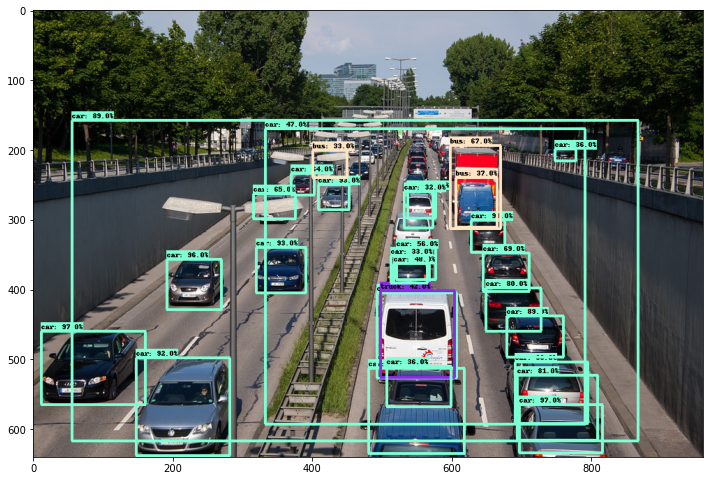

In [ ]:
# pipeline_config = './centernet_hg104_1024x1024_coco17_tpu-32/pipeline.config'
# model_dir = './centernet_hg104_1024x1024_coco17_tpu-32/checkpoint'
pipeline_config = './faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/pipeline.config'
model_dir = './faster_rcnn_resnet50_v1_640x640_coco17_tpu-8/checkpoint'

# Load pipeline config and build a detection model
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs['model']
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(model_dir, 'ckpt-0')).expect_partial()

show_inference(detection_model, 'traffic.jpg')

# Custom Inference via Saved model

In [8]:
!wget https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg -O traffic.jpg

--2020-09-15 19:05:11--  https://cdn.pixabay.com/photo/2013/07/05/01/08/traffic-143391_960_720.jpg
Resolving cdn.pixabay.com (cdn.pixabay.com)... 104.18.20.183, 104.18.21.183, 2606:4700::6812:15b7, ...
Connecting to cdn.pixabay.com (cdn.pixabay.com)|104.18.20.183|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 192644 (188K) [image/jpeg]
Saving to: ‘traffic.jpg’

traffic.jpg         100%[===================>] 188.13K  --.-KB/s    in 0.02s   

2020-09-15 19:05:12 (10.7 MB/s) - ‘traffic.jpg’ saved [192644/192644]



In [9]:
label_map_path='/content/models/research/object_detection/data/mscoco_label_map.pbtxt'
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

In [ ]:
category_index

{1: {'id': 1, 'name': 'person'},
 2: {'id': 2, 'name': 'bicycle'},
 3: {'id': 3, 'name': 'car'},
 4: {'id': 4, 'name': 'motorcycle'},
 5: {'id': 5, 'name': 'airplane'},
 6: {'id': 6, 'name': 'bus'},
 7: {'id': 7, 'name': 'train'},
 8: {'id': 8, 'name': 'truck'},
 9: {'id': 9, 'name': 'boat'},
 10: {'id': 10, 'name': 'traffic light'},
 11: {'id': 11, 'name': 'fire hydrant'},
 13: {'id': 13, 'name': 'stop sign'},
 14: {'id': 14, 'name': 'parking meter'},
 15: {'id': 15, 'name': 'bench'},
 16: {'id': 16, 'name': 'bird'},
 17: {'id': 17, 'name': 'cat'},
 18: {'id': 18, 'name': 'dog'},
 19: {'id': 19, 'name': 'horse'},
 20: {'id': 20, 'name': 'sheep'},
 21: {'id': 21, 'name': 'cow'},
 22: {'id': 22, 'name': 'elephant'},
 23: {'id': 23, 'name': 'bear'},
 24: {'id': 24, 'name': 'zebra'},
 25: {'id': 25, 'name': 'giraffe'},
 27: {'id': 27, 'name': 'backpack'},
 28: {'id': 28, 'name': 'umbrella'},
 31: {'id': 31, 'name': 'handbag'},
 32: {'id': 32, 'name': 'tie'},
 33: {'id': 33, 'name': 'suitc

In [ ]:
label_map_dict

{'airplane': 5,
 'apple': 53,
 'backpack': 27,
 'banana': 52,
 'baseball bat': 39,
 'baseball glove': 40,
 'bear': 23,
 'bed': 65,
 'bench': 15,
 'bicycle': 2,
 'bird': 16,
 'boat': 9,
 'book': 84,
 'bottle': 44,
 'bowl': 51,
 'broccoli': 56,
 'bus': 6,
 'cake': 61,
 'car': 3,
 'carrot': 57,
 'cat': 17,
 'cell phone': 77,
 'chair': 62,
 'clock': 85,
 'couch': 63,
 'cow': 21,
 'cup': 47,
 'dining table': 67,
 'dog': 18,
 'donut': 60,
 'elephant': 22,
 'fire hydrant': 11,
 'fork': 48,
 'frisbee': 34,
 'giraffe': 25,
 'hair drier': 89,
 'handbag': 31,
 'horse': 19,
 'hot dog': 58,
 'keyboard': 76,
 'kite': 38,
 'knife': 49,
 'laptop': 73,
 'microwave': 78,
 'motorcycle': 4,
 'mouse': 74,
 'orange': 55,
 'oven': 79,
 'parking meter': 14,
 'person': 1,
 'pizza': 59,
 'potted plant': 64,
 'refrigerator': 82,
 'remote': 75,
 'sandwich': 54,
 'scissors': 87,
 'sheep': 20,
 'sink': 81,
 'skateboard': 41,
 'skis': 35,
 'snowboard': 36,
 'spoon': 50,
 'sports ball': 37,
 'stop sign': 13,
 'suitca

In [ ]:
#SSD MobileNet V2 FPNLite 640x640
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz 
#!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/centernet_hg104_1024x1024_coco17_tpu-32.tar.gz
#!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
#https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md

--2020-09-14 23:39:13--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 74.125.23.128, 2404:6800:4008:c02::80
Connecting to download.tensorflow.org (download.tensorflow.org)|74.125.23.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20518283 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.57M  --.-KB/s    in 0.08s   

2020-09-14 23:39:13 (236 MB/s) - ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz’ saved [20518283/20518283]



In [ ]:
!tar -xf ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz

In [ ]:
!ls

models	     ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8	   traffic.jpg
sample_data  ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz


In [ ]:
!ls ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/

checkpoint  pipeline.config  saved_model


In [ ]:
import time
start_time = time.time()
tf.keras.backend.clear_session()
detect_fn = tf.saved_model.load('./ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/saved_model/')
end_time = time.time()
elapsed_time = end_time - start_time
print('Elapsed time: ' + str(elapsed_time) + 's')

Elapsed time: 12.561636209487915s


In [ ]:
print(detect_fn.signatures['serving_default'].inputs)

[<tf.Tensor 'input_tensor:0' shape=(1, None, None, 3) dtype=uint8>, <tf.Tensor 'unknown:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_0:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_1:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_2:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_3:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_4:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_5:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_6:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_7:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_8:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_9:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_10:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_11:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_12:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_13:0' shape=<unknown> dtype=resource>, <tf.Tensor 'unknown_14:0' shape=<unknown> dtype=resource>, <

In [ ]:
detect_fn.signatures['serving_default'].output_shapes

{'detection_anchor_indices': TensorShape([1, 100]),
 'detection_boxes': TensorShape([1, 100, 4]),
 'detection_classes': TensorShape([1, 100]),
 'detection_multiclass_scores': TensorShape([1, 100, 91]),
 'detection_scores': TensorShape([1, 100]),
 'num_detections': TensorShape([1]),
 'raw_detection_boxes': TensorShape([1, 51150, 4]),
 'raw_detection_scores': TensorShape([1, 51150, 91])}

In [ ]:
detect_fn

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x7fd924e26550>

10.553312540054321


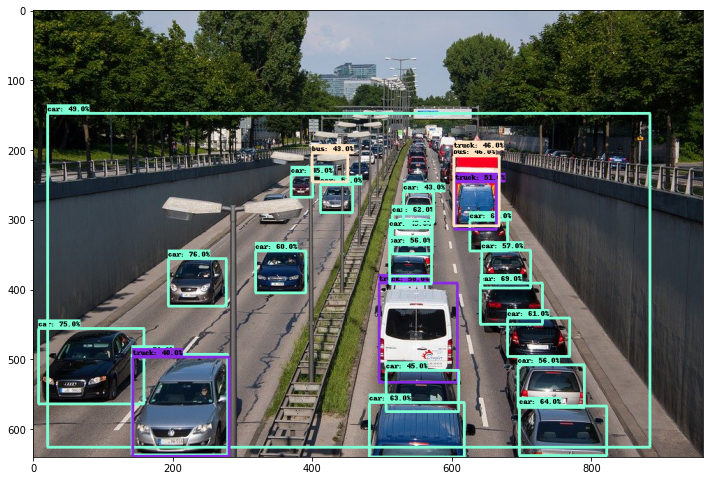

In [ ]:
image_path = os.path.join('traffic' + '.jpg')
#image_np = load_image_into_numpy_array(image_path)
img_data = tf.io.gfile.GFile(image_path, 'rb').read()
image = Image.open(BytesIO(img_data))
(im_width, im_height) = image.size
image_np = np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

input_tensor = np.expand_dims(image_np, 0)
start_time = time.time()
detections = detect_fn(input_tensor)
end_time = time.time()
print(end_time - start_time)

plt.rcParams['figure.figsize'] = [42, 21]
label_id_offset = 1
image_np_with_detections = image_np.copy()
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.int32),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.40,
      agnostic_mode=False)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()
#plt.subplot(2, 1, i+1)
#plt.imshow(image_np_with_detections)

# Convert to *TFLite*
ref: https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/running_on_mobile_tf2.md
https://github.com/tensorflow/models/blob/master/research/object_detection/export_tflite_graph_tf2.py


In [ ]:
!pwd

/content


In [ ]:
# From the tensorflow/models/research/ directory
!cd models/research/ && python object_detection/export_tflite_graph_tf2.py \
    --pipeline_config_path /content/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/pipeline.config \
    --trained_checkpoint_dir /content/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8/checkpoint \
    --output_directory /content/exported_model \
    --ssd_max_detections 100

2020-09-14 22:49:56.543235: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-14 22:49:58.702738: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-14 22:49:58.708675: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-14 22:49:58.709167: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.75GiB deviceMemoryBandwidth: 836.37GiB/s
2020-09-14 22:49:58.709206: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-14 22:49:58.711390: I tensorflow/stream_executor/plat

https://www.tensorflow.org/lite/convert
https://www.tensorflow.org/api_docs/python/tf/lite/TFLiteConverter#from_saved_model

In [ ]:
!ls /content/exported_model/saved_model

assets	saved_model.pb	variables


In [ ]:
import tensorflow as tf

# Convert the model
saved_model_dir = './exported_model/saved_model'
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir) # path to the SavedModel directory
tflite_model = converter.convert()

# Save the model.
with open('./model.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
!ls /content/exported_model/

saved_model


In [ ]:
!pwd

/content


In [ ]:
#Perform further optimization
saved_model_dir = './exported_model/saved_model'
converter2 = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
converter2.optimizations = [tf.lite.Optimize.DEFAULT] #Post-training quantization, the outputs are still stored using floating point
tflite_quant_model = converter2.convert()
open("./exported_model/model_quant1.tflite", "wb").write(tflite_quant_model)

544

In [ ]:
!zip exportedSSDfpnlite640.zip -r ./exported_model

  adding: exported_model/ (stored 0%)
  adding: exported_model/saved_model/ (stored 0%)
  adding: exported_model/saved_model/saved_model.pb (deflated 91%)
  adding: exported_model/saved_model/variables/ (stored 0%)
  adding: exported_model/saved_model/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: exported_model/saved_model/variables/variables.index (deflated 77%)
  adding: exported_model/saved_model/assets/ (stored 0%)
  adding: exported_model/model.tflite (deflated 46%)
  adding: exported_model/model_quant1.tflite (deflated 49%)


In [ ]:
from google.colab import files
files.download('exportedSSDfpnlite640.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

We can get further latency improvements, reductions in peak memory usage, and access to integer only hardware accelerators by making sure all model math is quantized. To do this, we need to measure the dynamic range of activations and inputs with a representative data set. You can simply create an input data generator and provide it to our converter.

In [ ]:
interpreter = tf.lite.Interpreter(model_path="./exported_model/model.tflite")
interpreter.allocate_tensors()

# TF nightly try

In [ ]:
!pip show tf-nightly-gpu

Name: tf-nightly-gpu
Version: 2.4.0.dev20200914
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.6/dist-packages
Requires: tb-nightly, google-pasta, h5py, numpy, typing-extensions, tf-estimator-nightly, protobuf, absl-py, wrapt, termcolor, wheel, six, flatbuffers, opt-einsum, grpcio, gast, keras-preprocessing, astunparse
Required-by: 


In [ ]:
!pip uninstall tf-nightly-gpu

Uninstalling tf-nightly-gpu-2.4.0.dev20200701:
  Would remove:
    /usr/local/bin/estimator_ckpt_converter
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.6/dist-packages/tensorflow/*
    /usr/local/lib/python3.6/dist-packages/tf_nightly_gpu-2.4.0.dev20200701.dist-info/*
  Would not remove (might be manually added):
    /usr/local/lib/python3.6/dist-packages/tensorflow/include/tensorflow/compiler/xla/service/gpu/partition_assignment.h
Proceed (y/n)? y
  Successfully uninstalled tf-nightly-gpu-2.4.0.dev20200701


In [ ]:
import tensorflow as tf 
tf.__version__

'2.4.0-dev20200701'

In [ ]:
saved_model_dir = './exported_model/saved_model'
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir,signature_keys=['serving_default'])
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.experimental_new_converter = True
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]

tflite_model = converter.convert()

with tf.io.gfile.GFile('model_nightly.tflite', 'wb') as f:
  f.write(tflite_model)

https://www.tensorflow.org/lite/performance/post_training_quantization

In [ ]:
saved_model_dir = './exported_model/saved_model'
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir,signature_keys=['serving_default'])
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.experimental_new_converter = True
#converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8,
                                       tf.lite.OpsSet.TFLITE_BUILTINS]

tflite_model = converter.convert()

with tf.io.gfile.GFile('model_nightly_int8.tflite', 'wb') as f:
  f.write(tflite_model)

# Custom Training

In [ ]:
from google.colab import auth
auth.authenticate_user()

In [ ]:
!gcloud config set project 'cmpelkk'

Updated property [core/project].


In [ ]:
!gsutil ls gs://waymodataset #cocodata-bucket

gs://waymodataset/TFRecordTrain--00000-of-00005.tfrecord
gs://waymodataset/TFRecordTrain--00001-of-00005.tfrecord
gs://waymodataset/TFRecordTrain--00002-of-00005.tfrecord
gs://waymodataset/TFRecordTrain--00003-of-00005.tfrecord
gs://waymodataset/TFRecordTrain--00004-of-00005.tfrecord
gs://waymodataset/TFRecordVal--00000-of-00005.tfrecord
gs://waymodataset/TFRecordVal--00001-of-00005.tfrecord
gs://waymodataset/TFRecordVal--00002-of-00005.tfrecord
gs://waymodataset/TFRecordVal--00003-of-00005.tfrecord
gs://waymodataset/TFRecordVal--00004-of-00005.tfrecord
gs://waymodataset/json_TFRecordTrain-.json
gs://waymodataset/json_TFRecordVal-.json
gs://waymodataset/waymo_labelmap.txt
gs://waymodataset/myoutputmodel/


## Check the TFRecord file

Ref: https://github.com/tensorflow/models/blob/6c63efed800ecd5f6168f17c706f35f07f27928b/official/nlp/transformer/data_pipeline.py#L193

In [ ]:
!mkdir tfrecords
!gsutil cp gs://waymodataset/TFRecordTrain--00000-of-00005.tfrecord ./tfrecords

Copying gs://waymodataset/TFRecordTrain--00000-of-00005.tfrecord...
- [1 files][147.2 MiB/147.2 MiB]                                                
Operation completed over 1 objects/147.2 MiB.                                    


In [ ]:
!ls ./tfrecords

TFRecordTrain--00000-of-00005.tfrecord


In [ ]:
Local_Train_Path='./tfrecords/TFRecordTrain*'
train_filenames = tf.io.gfile.glob(Local_Train_Path)

from official.vision.detection.dataloader import input_reader: https://github.com/tensorflow/models/blob/master/official/vision/detection/main.py https://github.com/tensorflow/models/blob/master/official/vision/detection/dataloader/input_reader.py

In [ ]:
#ref: https://github.com/tensorflow/models/blob/master/official/vision/detection/dataloader/tf_example_decoder.py
def _decode_image(parsed_tensors):
    """Decodes the image and set its static shape."""
    image = tf.io.decode_image(parsed_tensors['image/encoded'], channels=3)
    image.set_shape([None, None, 3])
    return image

def _decode_boxes(parsed_tensors):
    """Concat box coordinates in the format of [ymin, xmin, ymax, xmax]."""
    xmin = parsed_tensors['image/object/bbox/xmin']
    xmax = parsed_tensors['image/object/bbox/xmax']
    ymin = parsed_tensors['image/object/bbox/ymin']
    ymax = parsed_tensors['image/object/bbox/ymax']
    print(ymax)

    return tf.stack([ymin, xmin, ymax, xmax], axis=-1)

def _decode_areas(parsed_tensors):
    xmin = parsed_tensors['image/object/bbox/xmin']
    xmax = parsed_tensors['image/object/bbox/xmax']
    ymin = parsed_tensors['image/object/bbox/ymin']
    ymax = parsed_tensors['image/object/bbox/ymax']
    return tf.cond(
        tf.greater(tf.shape(parsed_tensors['image/object/area'])[0], 0),
        lambda: parsed_tensors['image/object/area'],
        lambda: (xmax - xmin) * (ymax - ymin))

def read_tfrecord(example):
    features = {
        'image/encoded':
            tf.io.FixedLenFeature((), tf.string),
        'image/source_id':
            tf.io.FixedLenFeature((), tf.string),
        'image/height':
            tf.io.FixedLenFeature((), tf.int64),
        'image/width':
            tf.io.FixedLenFeature((), tf.int64),
        'image/object/bbox/xmin':
            tf.io.VarLenFeature(tf.float32),
        'image/object/bbox/xmax':
            tf.io.VarLenFeature(tf.float32),
        'image/object/bbox/ymin':
            tf.io.VarLenFeature(tf.float32),
        'image/object/bbox/ymax':
            tf.io.VarLenFeature(tf.float32),
        'image/object/class/label':
            tf.io.VarLenFeature(tf.int64),
        'image/object/area':
            tf.io.VarLenFeature(tf.float32),
        'image/object/is_crowd':
            tf.io.VarLenFeature(tf.int64),
    }
    # features = {
    #     "image": tf.io.FixedLenFeature([], tf.string), # tf.string means bytestring
    #     "class": tf.io.FixedLenFeature([], tf.int64),  # shape [] means scalar
    # }
    example = tf.io.parse_single_example(example, features)

    for k in example:
      if isinstance(example[k], tf.SparseTensor):
        if example[k].dtype == tf.string:
          example[k] = tf.sparse.to_dense(
              example[k], default_value='')
        else:
          example[k] = tf.sparse.to_dense(
              example[k], default_value=0)
          
    print("Got example")
    print(example['image/object/bbox/xmin'])
    image = _decode_image(example)
    print("Decoded image")
    boxes = _decode_boxes(example)
    print("Decoded boxes:", boxes)
    areas = _decode_areas(example)
    is_crowds = tf.cond(
        tf.greater(tf.shape(example['image/object/is_crowd'])[0], 0),
        lambda: tf.cast(example['image/object/is_crowd'], dtype=tf.bool),
        lambda: tf.zeros_like(example['image/object/class/label'], dtype=tf.bool))  # pylint: disable=line-too-long

    source_id = example['image/source_id']
    height=example['image/height']
    width=example['image/width']
    groundtruth_class=example['image/object/class/label']

    #image = tf.image.decode_jpeg(example['image'], channels=3)
    image = tf.cast(image, tf.float32) / 255.0  # convert image to floats in [0, 1] range
    image = tf.image.resize(image, IMAGE_SIZE)
    #image = tf.reshape(image, [*IMAGE_SIZE, 3]) # explicit size will be needed for TPU
    #class_label = example['class']
    print(groundtruth_class)
    decoded_tensors = {
        'image': image,
        'source_id': source_id,
        'height':height,
        'width':width,
        'groundtruth_classes': groundtruth_class,
        'groundtruth_is_crowd': is_crowds,
        'groundtruth_area': areas,
        'groundtruth_boxes': boxes,
    }
    return decoded_tensors#image, class_label

def load_dataset(filenames):
  # read from TFRecords. For optimal performance, read from multiple
  # TFRecord files at once and set the option experimental_deterministic = False
  # to allow order-altering optimizations.

  option_no_order = tf.data.Options()
  option_no_order.experimental_deterministic = False

  dataset = tf.data.TFRecordDataset(filenames, num_parallel_reads=AUTO)
  dataset = dataset.with_options(option_no_order)
  dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTO)
  return dataset

In [ ]:
AUTO = tf.data.experimental.AUTOTUNE
IMAGE_SIZE = [640, 640] #[192, 192]
display_dataset=load_dataset(train_filenames)

Got example
Tensor("SparseToDense_2:0", shape=(None,), dtype=float32)
Decoded image
Tensor("SparseToDense_3:0", shape=(None,), dtype=float32)
Decoded boxes: Tensor("stack:0", shape=(None, 4), dtype=float32)
Tensor("SparseToDense_5:0", shape=(None,), dtype=int64)


In [ ]:
decoded_tensors =next(iter(display_dataset))
decoded_tensors

{'groundtruth_area': <tf.Tensor: shape=(28,), dtype=float32, numpy=
 array([1.3813018e-04, 7.1024448e-02, 3.1164298e-05, 1.1053344e-01,
        8.5865184e-05, 3.4345756e-04, 2.8014310e-02, 4.2039723e-04,
        5.9358717e-04, 2.2156033e-04, 2.0308865e-03, 3.4995115e-04,
        2.3373224e-05, 2.8911594e-03, 4.2510359e-03, 2.4266035e-04,
        1.0453107e-04, 5.8719148e-03, 3.8548259e-03, 2.6587278e-04,
        4.3873844e-04, 6.7198554e-05, 1.5403732e-03, 1.4543472e-04,
        2.7187803e-04, 3.6131436e-04, 6.5161418e-03, 2.1019815e-04],
       dtype=float32)>,
 'groundtruth_boxes': <tf.Tensor: shape=(28, 4), dtype=float32, numpy=
 array([[0.520815  , 0.37155256, 0.5390719 , 0.37911847],
        [0.6636629 , 0.78882957, 1.        , 1.        ],
        [0.5097129 , 0.44408673, 0.515634  , 0.44934997],
        [0.59260905, 0.3796119 , 0.98241854, 0.6631695 ],
        [0.51292014, 0.39655298, 0.52426904, 0.40411893],
        [0.5277231 , 0.2865182 , 0.5390719 , 0.31678185],
        [0.5

In [ ]:
decoded_tensors['groundtruth_boxes'].numpy()

array([[0.520815  , 0.37155256, 0.5390719 , 0.37911847],
       [0.6636629 , 0.78882957, 1.        , 1.        ],
       [0.5097129 , 0.44408673, 0.515634  , 0.44934997],
       [0.59260905, 0.3796119 , 0.98241854, 0.6631695 ],
       [0.51292014, 0.39655298, 0.52426904, 0.40411893],
       [0.5277231 , 0.2865182 , 0.5390719 , 0.31678185],
       [0.5274763 , 0.46546867, 0.6597155 , 0.67731446],
       [0.5168676 , 0.30230793, 0.53413767, 0.32665044],
       [0.53068364, 0.26760337, 0.5568354 , 0.29030114],
       [0.5282165 , 0.3136568 , 0.5385785 , 0.33503875],
       [0.5368515 , 0.17368725, 0.582247  , 0.21842487],
       [0.5136603 , 0.37648684, 0.5353712 , 0.39260554],
       [0.5084793 , 0.45724484, 0.51292014, 0.46250808],
       [0.5284632 , 0.3171108 , 0.5886616 , 0.36513796],
       [0.5708982 , 0.        , 0.66662353, 0.04440867],
       [0.5198282 , 0.3320782 , 0.53117704, 0.35346013],
       [0.513907  , 0.48619273, 0.5252559 , 0.4954034 ],
       [0.5348778 , 0.07039597,

In [ ]:
decoded_tensors['width'].numpy()

1920

In [ ]:
testimage=decoded_tensors['image']
testlabel=decoded_tensors['groundtruth_classes'].numpy()
testboundingbox=decoded_tensors['groundtruth_boxes'].numpy()
testlabel.size

28

In [ ]:
testboundingbox.shape

(28, 4)

In [ ]:
[xmin, ymin, xmax, ymax]=testboundingbox[0]

In [ ]:
testboundingbox[0]*192

array([ 99.99648,  71.33809, 103.50181,  72.79075], dtype=float32)

In [ ]:
xmin

0.520815

In [ ]:
IMAGE_SIZE[0]

192

In [ ]:
INSTANCE_CATEGORY_NAMES[1]

'Vehicles'

28
[0.520815   0.37155256 0.5390719  0.37911847]
Class id: 1
[0.6636629  0.78882957 1.         1.        ]
Class id: 1
[0.5097129  0.44408673 0.515634   0.44934997]
Class id: 1
[0.59260905 0.3796119  0.98241854 0.6631695 ]
Class id: 1
[0.51292014 0.39655298 0.52426904 0.40411893]
Class id: 1
[0.5277231  0.2865182  0.5390719  0.31678185]
Class id: 1
[0.5274763  0.46546867 0.6597155  0.67731446]
Class id: 1
[0.5168676  0.30230793 0.53413767 0.32665044]
Class id: 1
[0.53068364 0.26760337 0.5568354  0.29030114]
Class id: 1
[0.5282165  0.3136568  0.5385785  0.33503875]
Class id: 1
[0.5368515  0.17368725 0.582247   0.21842487]
Class id: 1
[0.5136603  0.37648684 0.5353712  0.39260554]
Class id: 1
[0.5084793  0.45724484 0.51292014 0.46250808]
Class id: 1
[0.5284632  0.3171108  0.5886616  0.36513796]
Class id: 1
[0.5708982  0.         0.66662353 0.04440867]
Class id: 1
[0.5198282  0.3320782  0.53117704 0.35346013]
Class id: 1
[0.513907   0.48619273 0.5252559  0.4954034 ]
Class id: 1
[0.5348778 

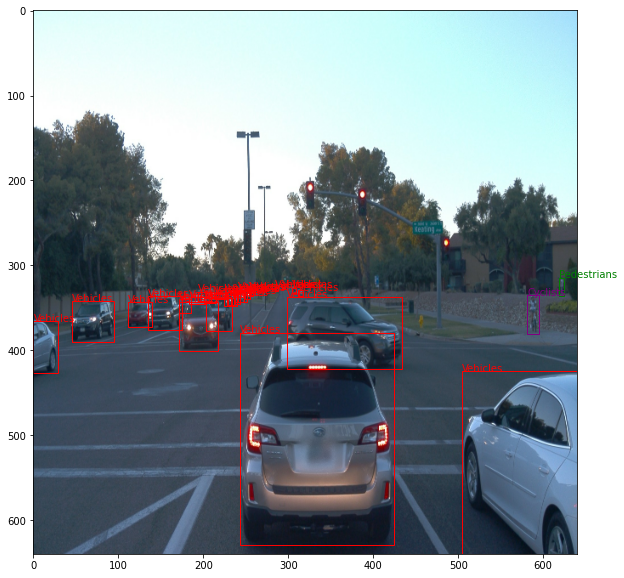

In [ ]:
import pandas as pd
import os, sys, math
import numpy as np
from matplotlib import pyplot as plt
import matplotlib.patches as patches

##Unknown:0, Vehicles: 1, Pedestrians: 2, Cyclists: 3, Signs (removed)
INSTANCE_CATEGORY_NAMES = [
    'Unknown', 'Vehicles', 'Pedestrians', 'Cyclists'
]
INSTANCE_Color = {
    'Unknown':'black', 'Vehicles':'red', 'Pedestrians':'green', 'Cyclists':'purple'
}#'Unknown', 'Vehicles', 'Pedestrians', 'Cyclists'


def show_oneimage_category(image, label, boundingbox):
  fig = plt.figure(figsize=(10,10))
  ax = fig.add_subplot(1, 1, 1)

  len=label.size
  print(len)
  for index in range(len):
    box= boundingbox[index]
    print(box)
    labelid=label[index]
    labelname=INSTANCE_CATEGORY_NAMES[labelid]
    print("Class id:", labelid)
    classcolor=INSTANCE_Color[labelname]
    [xmin, ymin, xmax, ymax]=box*IMAGE_SIZE[0]
    # Draw the object bounding box.
    ax.add_patch(patches.Rectangle(
        xy=(ymin,
            xmin),
        width=ymax-ymin,
        height=xmax-xmin,
        linewidth=1,
        edgecolor=classcolor, #'red',
        facecolor='none'))
    ax.text(ymin, xmin, labelname, color=classcolor, fontsize=10)
            
  
  plt.imshow(image)
  #plt.title(CLASSES[label_batch.numpy()])

testimage=decoded_tensors['image']
testlabel=decoded_tensors['groundtruth_classes'].numpy()
testboundingbox=decoded_tensors['groundtruth_boxes'].numpy()
show_oneimage_category(testimage, testlabel, testboundingbox)

## Start Training

Configure the pipeline.config:


1.   change num_classes
2.   change batch_size
3.   label_map_path
4.   train input tfrecord
5.   val input tfrecord



In [ ]:
!mkdir myoutputmodel

In [ ]:
!gsutil cp gs://waymodataset/waymo_labelmap.txt .

Copying gs://waymodataset/waymo_labelmap.txt...
/ [1 files][  114.0 B/  114.0 B]                                                
Operation completed over 1 objects/114.0 B.                                      


In [ ]:
#Download model from https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md
#!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz 

--2020-09-15 00:55:12--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.126.128, 2a00:1450:4013:c01::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.126.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20518283 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.57M  38.9MB/s    in 0.5s    

2020-09-15 00:55:13 (38.9 MB/s) - ‘ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz’ saved [20518283/20518283]



In [ ]:
!tar -xf ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz

In [ ]:
MODELS_CONFIG = {
    'fasterrcnnresnet50_640': {
        'model_name': 'faster_rcnn_resnet50_v1_640x640_coco17_tpu-8',
        'base_pipeline_file': 'faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'faster_rcnn_resnet50_v1_640x640_coco17_tpu-8.tar.gz',
        'batch_size':4
    },
    'ssdmobilenetv2fpn640_640':{
        'model_name': 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8',
        'base_pipeline_file': 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'ssd_mobilenet_v2_fpnlite_640x640_coco17_tpu-8.tar.gz',
        'batch_size':4
    }
}

chosen_model = 'ssdmobilenetv2fpn640_640'#'efficientdet-d0'

num_steps = 30000 #The more steps, the longer the training. Increase if your loss function is still decreasing and validation metrics are increasing. 
num_eval_steps = 500 #Perform evaluation after so many steps


model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size']

In [ ]:
pipeline_fname = './'+ model_name + '/pipeline.config' # + base_pipeline_file
fine_tune_checkpoint = './' + model_name + '/checkpoint/ckpt-0'
label_map_pbtxt_fname = './waymo_labelmap.txt'

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
num_classes

3

In [ ]:
train_record_fname = "gs://waymodataset/TFRecordTrain*"#"./tfrecords/TFRecords-Train*"
test_record_fname = "gs://waymodataset/TFRecordVal*"#./tfrecords/TFRecords-Val*"

In [ ]:
#write custom configuration file by slotting our dataset, model checkpoint, and training parameters into the base pipeline file

import re
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:
    
    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(test_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)
    
    #fine-tune checkpoint type
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
        
    f.write(s)



writing custom configuration file


In [ ]:
import tensorflow as tf
print("GPU Available: ", tf.test.is_gpu_available())

print("Tensorflow Version: ", tf.__version__)
print("Keras Version: ", tf.keras.__version__)

#check GPU
physical_devices = tf.config.experimental.list_physical_devices('GPU')
print(physical_devices)

GPU Available:  True
Tensorflow Version:  2.3.0
Keras Version:  2.4.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [ ]:
PIPELINE_CONFIG_PATH='./pipeline_file.config'
MODEL_DIR='./myoutputmodel'
!python models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={PIPELINE_CONFIG_PATH} \
    --model_dir={MODEL_DIR} \
    --alsologtostderr
!zip myoutputmodel_ssd.zip -r ./myoutputmodel
from google.colab import files
files.download('myoutputmodel_ssd.zip')

2020-09-15 00:56:22.767269: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 00:56:25.119567: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-15 00:56:25.125696: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-15 00:56:25.126339: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.75GiB deviceMemoryBandwidth: 836.37GiB/s
2020-09-15 00:56:25.126376: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 00:56:25.128225: I tensorflow/stream_executor/plat

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
!ls myoutputmodel

checkpoint		     ckpt-38.index
ckpt-35.data-00000-of-00001  ckpt-39.data-00000-of-00001
ckpt-35.index		     ckpt-39.index
ckpt-36.data-00000-of-00001  ckpt-40.data-00000-of-00001
ckpt-36.index		     ckpt-40.index
ckpt-37.data-00000-of-00001  ckpt-41.data-00000-of-00001
ckpt-37.index		     ckpt-41.index
ckpt-38.data-00000-of-00001  train


In [ ]:
PIPELINE_CONFIG_PATH='./pipeline_file.config'
MODEL_DIR='./myoutputmodel'
CHECKPOINT_DIR='./myoutputmodel'
!python models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={PIPELINE_CONFIG_PATH} \
    --model_dir={MODEL_DIR} \
    --checkpoint_dir={CHECKPOINT_DIR} \
    --alsologtostderr

2020-09-15 06:08:37.257180: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
W0915 06:08:44.126142 140326410917760 model_lib_v2.py:925] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0915 06:08:44.126423 140326410917760 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0915 06:08:44.126527 140326410917760 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0915 06:08:44.126617 140326410917760 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0915 06:08:44.126749 140326410917760 model_lib_v2.py:940] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2020-09-15 06:08:44.161484: I tensorflow/stream_executor/pl

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%tensorboard --logdir ./myoutputmodel/

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from tensorboard import notebook
notebook.list() # View open TensorBoard instances

Known TensorBoard instances:
  - port 6006: logdir ./myoutputmodel/ (started 0:01:08 ago; pid 3040)


In [ ]:
PIPELINE_CONFIG_PATH='./pipeline_file.config'
!python models/research/object_detection/exporter_main_v2.py --input_type image_tensor --pipeline_config_path {PIPELINE_CONFIG_PATH} --trained_checkpoint_dir ./myoutputmodel --output_directory ./exported-models


2020-09-15 06:25:50.421038: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 06:26:34.518719: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-15 06:26:34.706794: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-15 06:26:34.708298: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.75GiB deviceMemoryBandwidth: 836.37GiB/s
2020-09-15 06:26:34.712503: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 06:26:35.123561: I tensorflow/stream_executor/plat

In [ ]:
!zip exported-models.zip -r ./exported-models

  adding: exported-models/ (stored 0%)
  adding: exported-models/saved_model/ (stored 0%)
  adding: exported-models/saved_model/saved_model.pb (deflated 93%)
  adding: exported-models/saved_model/variables/ (stored 0%)
  adding: exported-models/saved_model/variables/variables.data-00000-of-00001 (deflated 8%)
  adding: exported-models/saved_model/variables/variables.index (deflated 77%)
  adding: exported-models/saved_model/assets/ (stored 0%)
  adding: exported-models/pipeline.config (deflated 68%)
  adding: exported-models/checkpoint/ (stored 0%)
  adding: exported-models/checkpoint/ckpt-0.index (deflated 80%)
  adding: exported-models/checkpoint/checkpoint (deflated 42%)
  adding: exported-models/checkpoint/ckpt-0.data-00000-of-00001 (deflated 8%)


In [ ]:
!gsutil cp exported-models.zip gs://waymodataset/

Copying file://exported-models.zip [Content-Type=application/zip]...
\
Operation completed over 1 objects/19.0 MiB.                                     


# Continue Training

In [ ]:
PIPELINE_CONFIG_PATH='./pipeline_file.config' # change the num_steps from 30000 to 60000
MODEL_DIR='./myoutputmodel'
!python models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={PIPELINE_CONFIG_PATH} \
    --model_dir={MODEL_DIR} \
    --alsologtostderr

!python models/research/object_detection/exporter_main_v2.py --input_type image_tensor --pipeline_config_path {PIPELINE_CONFIG_PATH} --trained_checkpoint_dir ./myoutputmodel --output_directory ./Newexported-models2

!zip Newexported-models_ssd.zip -r ./Newexported-models2
from google.colab import files
files.download('Newexported-models_ssd.zip')

2020-09-15 06:50:40.898825: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 06:50:43.203216: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-15 06:50:43.209619: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-15 06:50:43.210147: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.75GiB deviceMemoryBandwidth: 836.37GiB/s
2020-09-15 06:50:43.210189: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 06:50:43.212147: I tensorflow/stream_executor/plat

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [10]:
from google.colab import auth
auth.authenticate_user()

In [11]:
!unzip ./Newexported-models_ssd_60k.zip

Archive:  ./Newexported-models_ssd_60k.zip
   creating: Newexported-models2/
   creating: Newexported-models2/saved_model/
  inflating: Newexported-models2/saved_model/saved_model.pb  
   creating: Newexported-models2/saved_model/variables/
  inflating: Newexported-models2/saved_model/variables/variables.data-00000-of-00001  
  inflating: Newexported-models2/saved_model/variables/variables.index  
   creating: Newexported-models2/saved_model/assets/
  inflating: Newexported-models2/pipeline.config  
   creating: Newexported-models2/checkpoint/
  inflating: Newexported-models2/checkpoint/ckpt-0.index  
  inflating: Newexported-models2/checkpoint/checkpoint  
  inflating: Newexported-models2/checkpoint/ckpt-0.data-00000-of-00001  


In [12]:
!ls Newexported-models2

checkpoint  pipeline.config  saved_model


In [13]:
!pwd

/content


In [14]:
!gsutil cp gs://waymodataset/waymo_labelmap.txt .

Copying gs://waymodataset/waymo_labelmap.txt...
- [1 files][  114.0 B/  114.0 B]                                                
Operation completed over 1 objects/114.0 B.                                      


In [15]:
#change the finetune checkpoint path: fine_tune_checkpoint: "/content/Newexported-models2/checkpoint/ckpt-0"
#Do the evaluation
PIPELINE_CONFIG_PATH='./Newexported-models2/pipeline.config'
MODEL_DIR='./Newexported-models2'
CHECKPOINT_DIR='./Newexported-models2/checkpoint'
!python models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={PIPELINE_CONFIG_PATH} \
    --model_dir={MODEL_DIR} \
    --checkpoint_dir={CHECKPOINT_DIR} \
    --alsologtostderr

2020-09-15 19:26:32.190606: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
W0915 19:26:34.344311 140141455054720 model_lib_v2.py:925] Forced number of epochs for all eval validations to be 1.
INFO:tensorflow:Maybe overwriting sample_1_of_n_eval_examples: None
I0915 19:26:34.344535 140141455054720 config_util.py:552] Maybe overwriting sample_1_of_n_eval_examples: None
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0915 19:26:34.344656 140141455054720 config_util.py:552] Maybe overwriting use_bfloat16: False
INFO:tensorflow:Maybe overwriting eval_num_epochs: 1
I0915 19:26:34.344767 140141455054720 config_util.py:552] Maybe overwriting eval_num_epochs: 1
W0915 19:26:34.344883 140141455054720 model_lib_v2.py:940] Expected number of evaluation epochs is 1, but instead encountered `eval_on_train_input_config.num_epochs` = 0. Overwriting `num_epochs` to 1.
2020-09-15 19:26:34.355132: I tensorflow/stream_executor/pl

In [16]:
#change num_steps to 90000
PIPELINE_CONFIG_PATH='./Newexported-models2/pipeline.config' # change the num_steps from 30000 to 60000
MODEL_DIR='./myoutputmodel'
!python models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={PIPELINE_CONFIG_PATH} \
    --model_dir={MODEL_DIR} \
    --alsologtostderr

!python models/research/object_detection/exporter_main_v2.py --input_type image_tensor --pipeline_config_path {PIPELINE_CONFIG_PATH} --trained_checkpoint_dir ./myoutputmodel --output_directory ./Newexported-models3

!zip Newexported-models_ssd.zip -r ./Newexported-models3
from google.colab import files
files.download('Newexported-models_ssd.zip')

2020-09-15 19:39:04.428441: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 19:39:06.528546: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-15 19:39:06.534172: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-15 19:39:06.534813: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.75GiB deviceMemoryBandwidth: 836.37GiB/s
2020-09-15 19:39:06.534853: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 19:39:06.536613: I tensorflow/stream_executor/plat

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# Test inference based on trained model

In [ ]:
import time
start_time = time.time()
tf.keras.backend.clear_session()
detect_fn = tf.saved_model.load('./exported-models/saved_model/')
end_time = time.time()
elapsed_time = end_time - start_time
print('Elapsed time: ' + str(elapsed_time) + 's')

Elapsed time: 18.104347467422485s


In [ ]:
label_map_path='./waymo_labelmap.txt'
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

10.451684951782227


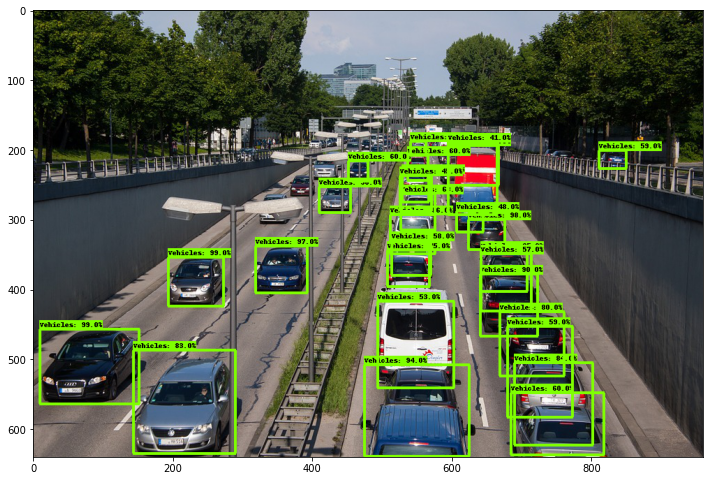

In [ ]:
image_path = os.path.join('traffic' + '.jpg')
#image_np = load_image_into_numpy_array(image_path)
img_data = tf.io.gfile.GFile(image_path, 'rb').read()
image = Image.open(BytesIO(img_data))
(im_width, im_height) = image.size
image_np = np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

input_tensor = np.expand_dims(image_np, 0)
start_time = time.time()
detections = detect_fn(input_tensor)
end_time = time.time()
print(end_time - start_time)

plt.rcParams['figure.figsize'] = [42, 21]
label_id_offset = 1
image_np_with_detections = image_np.copy()
viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      detections['detection_classes'][0].numpy().astype(np.int32),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.40,
      agnostic_mode=False)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()

In [ ]:
!zip exported.zip -r ./exported-models

  adding: exported-models/ (stored 0%)
  adding: exported-models/pipeline.config (deflated 66%)
  adding: exported-models/checkpoint/ (stored 0%)
  adding: exported-models/checkpoint/checkpoint (deflated 42%)
  adding: exported-models/checkpoint/ckpt-0.data-00000-of-00001 (deflated 7%)
  adding: exported-models/checkpoint/ckpt-0.index (deflated 80%)
  adding: exported-models/saved_model/ (stored 0%)
  adding: exported-models/saved_model/saved_model.pb (deflated 93%)
  adding: exported-models/saved_model/assets/ (stored 0%)
  adding: exported-models/saved_model/variables/ (stored 0%)
  adding: exported-models/saved_model/variables/variables.index (deflated 80%)
  adding: exported-models/saved_model/variables/variables.data-00000-of-00001 (deflated 7%)


# Export TFLite

In [ ]:
# From the tensorflow/models/research/ directory
!cd models/research/ && python object_detection/export_tflite_graph_tf2.py \
    --pipeline_config_path /content/exported-models/pipeline.config \
    --trained_checkpoint_dir /content/exported-models/checkpoint \
    --output_directory /content/exported_tflitemodel \
    --ssd_max_detections 100

2020-09-15 06:36:22.717483: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 06:36:26.239666: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-15 06:36:26.245877: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-15 06:36:26.246400: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.75GiB deviceMemoryBandwidth: 836.37GiB/s
2020-09-15 06:36:26.246449: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 06:36:26.252230: I tensorflow/stream_executor/plat

In [ ]:
# From the tensorflow/models/research/ directory
!cd models/research/ && python object_detection/export_tflite_graph_tf2.py \
    --pipeline_config_path /content/pipeline_file.config \
    --trained_checkpoint_dir /content/myoutputmodel \
    --output_directory /content/exported_tflitemodel2 \
    --ssd_max_detections 100

2020-09-15 06:40:19.654013: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 06:40:21.792051: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-09-15 06:40:21.798349: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:982] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2020-09-15 06:40:21.798857: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla V100-SXM2-16GB computeCapability: 7.0
coreClock: 1.53GHz coreCount: 80 deviceMemorySize: 15.75GiB deviceMemoryBandwidth: 836.37GiB/s
2020-09-15 06:40:21.798898: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-09-15 06:40:21.800729: I tensorflow/stream_executor/plat

In [ ]:
saved_model_dir = './exported_tflitemodel/saved_model'
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir,signature_keys=['serving_default'])
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.experimental_new_converter = True
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]

tflite_model = converter.convert()

with tf.io.gfile.GFile('./exported_tflitemodel/model.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
saved_model_dir = './exported_tflitemodel2/saved_model'
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir,signature_keys=['serving_default'])
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.experimental_new_converter = True
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]

tflite_model = converter.convert()

with tf.io.gfile.GFile('./exported_tflitemodel2/model.tflite', 'wb') as f:
  f.write(tflite_model)

# Video Data

In [ ]:
!pip install pytube3 #https://pypi.org/project/pytube3/

In [ ]:
#!pip3 install pytube --user
import pytube
video_url = 'https://www.youtube.com/watch?v=_i4qgq2rzRs'#'https://www.youtube.com/watch?v=gY8E8ILFkzo'
youtube = pytube.YouTube(video_url)
video = youtube.streams.first()

In [ ]:
!pwd
!mkdir videos

/content


In [ ]:
video.download('videos/')

'/content/videos/Driving in San Jose 4K - Silicon Valley - California USA.mp4'

In [ ]:
!mv ./videos/*.mp4 testvideo1.mp4

In [ ]:
import os
import pathlib
import cv2
import time
#!apt install python3-opencv
print(cv2.__version__)

4.4.0


In [ ]:
!pip install --upgrade imutils

Requirement already up-to-date: imutils in /usr/local/lib/python3.6/dist-packages (0.5.3)


In [ ]:
from imutils.video import FPS
import imutils

In [ ]:
!ffmpeg -i testvideo1.mp4 -t 00:00:06 -c:v copy video-clip.mp4

ffmpeg version 3.4.8-0ubuntu0.2 Copyright (c) 2000-2020 the FFmpeg developers
  built with gcc 7 (Ubuntu 7.5.0-3ubuntu1~18.04)
  configuration: --prefix=/usr --extra-version=0ubuntu0.2 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --enable-gpl --disable-stripping --enable-avresample --enable-avisynth --enable-gnutls --enable-ladspa --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librubberband --enable-librsvg --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvorbis --enable-libvpx --enable-libwavpack --enable-libwebp --enable-libx265 --enable-libxml2 --enable-libxvid --enable-lib

In [ ]:
import time
start_time = time.time()
tf.keras.backend.clear_session()
detect_fn = tf.saved_model.load('./exported-models/saved_model/')
end_time = time.time()
elapsed_time = end_time - start_time
print('Elapsed time: ' + str(elapsed_time) + 's')

In [ ]:
label_map_path='./UAVision.txt'
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

In [ ]:
import cv2
video_path='./testvideo1.mp4'
cap = cv2.VideoCapture(video_path)
print(cap.get(cv2.CAP_PROP_FPS))
# We convert the resolutions from float to integer.
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))
print(frame_width)
print(frame_height)

30.0
640
360


In [ ]:
fps = FPS().start()

# Define the codec and create VideoWriter object.
#out = cv2.VideoWriter('./output_video2.mp4',cv2.VideoWriter_fourcc('M','J','P','G'), 10, (frame_width,frame_height))
out = cv2.VideoWriter('./output_video1.mp4',cv2.VideoWriter_fourcc('M','P','4','V'), 30, (frame_width,frame_height))

i=0

# frame 
currentframe = 0
while (cap.isOpened() and currentframe<2000):
  ret, image_np = cap.read()
  if len((np.array(image_np)).shape) == 0:
    break
  
  input_tensor = np.expand_dims(image_np, 0)
  start_time = time.time()
  detections = detect_fn(input_tensor)
  end_time = time.time()
  print(end_time - start_time)

  plt.rcParams['figure.figsize'] = [42, 21]
  label_id_offset = 1
  image_np_with_detections = image_np.copy()
  viz_utils.visualize_boxes_and_labels_on_image_array(
        image_np_with_detections,
        detections['detection_boxes'][0].numpy(),
        detections['detection_classes'][0].numpy().astype(np.int32),
        detections['detection_scores'][0].numpy(),
        category_index,
        use_normalized_coordinates=True,
        max_boxes_to_draw=200,
        min_score_thresh=.40,
        agnostic_mode=False)

  #display(Image.fromarray(image_np))
  #cv2_imshow('object detection', cv2.resize(image_np, (800,600)))
  #cv2_imshow(cv2.resize(image_np, (640,360)))
  name = './Test_data/frame' + str(currentframe) + '.jpg'
  print ('Creating\...' + name) 
  cv2.imwrite(name, image_np_with_detections) 
  # increasing counter so that it will 
            # show how many frames are created 
  currentframe += 1
  fps.update()
  out.write(image_np_with_detections)

# stop the timer and display FPS information
fps.stop()
print("[INFO] elasped time: {:.2f}".format(fps.elapsed()))
print("[INFO] approx. FPS: {:.2f}".format(fps.fps()))
cap.release()
out.release()
#cv2.destroyAllWindows()

0.0599672794342041
Creating\..../Test_data/frame0.jpg
0.04968070983886719
Creating\..../Test_data/frame1.jpg
0.0490415096282959
Creating\..../Test_data/frame2.jpg
0.04706883430480957
Creating\..../Test_data/frame3.jpg
0.05391645431518555
Creating\..../Test_data/frame4.jpg
0.04742431640625
Creating\..../Test_data/frame5.jpg
0.046170711517333984
Creating\..../Test_data/frame6.jpg
0.04781341552734375
Creating\..../Test_data/frame7.jpg
0.04700446128845215
Creating\..../Test_data/frame8.jpg
0.04677987098693848
Creating\..../Test_data/frame9.jpg
0.04561662673950195
Creating\..../Test_data/frame10.jpg
0.046790361404418945
Creating\..../Test_data/frame11.jpg
0.04665207862854004
Creating\..../Test_data/frame12.jpg
0.04656052589416504
Creating\..../Test_data/frame13.jpg
0.04479169845581055
Creating\..../Test_data/frame14.jpg
0.04663658142089844
Creating\..../Test_data/frame15.jpg
0.045497894287109375
Creating\..../Test_data/frame16.jpg
0.04718732833862305
Creating\..../Test_data/frame17.jpg
0.04

error: ignored